# Drawing with Fourier Transform / Epicycles
## Warning!
Dumb guy explaining super cool math in a bad way ahead. If you would really like to learn about the Fourier Transform, check out these

- https://www.jezzamon.com/fourier/index.html (super cool animations)
- https://www.3blue1brown.com/lessons/fourier-series (very well explained, also a video for people who don't like to read)

## Oversimplified Intro
The basic gist of it is, instead of approximating functions with $sin$ / $cos$ as you regularly do for Fourier Series, it is possible to make things more generalized and approximate a function using the sum of lots of rotating vectors. This makes things a bit cleaner and easier to understand.

We will think of a function that takes a real number in some fixed interval and whose output can be any complex number in the 2D complex plane. Instead of limiting our functions to a 1-dimensional pencile sketch, we can essentially draw a path in the complex output space. When we break this output down into rotating vectors, we will notice that all the vectors with frequency (rotations per second) 1 and -1 are the same, but horizontal reflections of each other. This is true for vectors with frequency 2 and -2, 3 and -3, so on and so on.

We can use the function $e^{it}$ as shorthand to describe a rotating vector -- (why? It's the heart of the fourier series + some other stuff *that doesn't really fall into the 'basic gist' category*). So, with this function, we can write down a formula for each of the rotating vectors we have. 
## The Process in Theory
### Vectors, you say?
Suppose it's from 1 to 0 (that is to say, as we move from some time $t$ from $t=0$ to $t=1$):

The first vector is just constant $$1$$ it doesn't move at all. The next will rotate one cycle every second $$e^{2\pi it}$$ The $2\pi$ is there because as $t$ goes from $0$ to $1$, it needs to cover a distance of $2 \pi$ along the circle). It will also have a *nega-vector*, rotating at 1 cycle per second in the opposite direction $$e^{-2\pi it}$$
The next will move two rotations per second $$e^{2 \cdot 2 \pi it}$$ and it also has a nega-vector. This goes on and on for however many vectors you would like to use to approximate the function (well, it's really an infinite series but *we want to get an answer somewhere in here*).

If we rewrite the constant vector to $e^{0 \cdot 2\pi it}$, a pattern emerges:
$$
\ldots, e^{-2\cdot\pi it}, e^{-1\cdot\pi it}, e^{0\cdot\pi it}, e^{1\cdot\pi it}, e^{2\cdot\pi it}, \ldots
$$
### Determining constants
We can control the initial size and direction of each of these vectors by multiplying each by some complex number $c_n$, and then express any arbitrary function as a sum of terms like that
$$
f(t) = \ldots + c_{-2}e^{-2\cdot\pi it} + c_{-1}e^{-1\cdot\pi it} + c_{0}e^{0\cdot\pi it} + c_{1}e^{1\cdot\pi it} + c_{2}e^{2\cdot\pi it} + \ldots
$$
so we need to find a way to get constants from data of the function.

Again, this is easiest for the constant term. It's essentially the 'average'/center for the entire drawing, so if we took some evenly spaced values from the input, their average of all their outputs would be $c_0$. The more values you sampled, the more their average would approach $c_0$. This is basically just describing dividing the integral of $f(t)$ by the length of the integral
$$
c_0 = \frac{1}{1-0}\int_0^1 f(t) \: dt
$$
But, because we're looking at the average value for each vector, this is actually gonna get rid *all other terms* (***oh no***). Because each vector makes a lot of rotations from 0 to 1, the average value will be zero. Why does the constant term remain? Because it's static and doesn't rotate so the average is just the number that it started on -- $c_0$. That means that if we can find a way to make the vector we want to find the constant for hold still, we can get it. *How do we do this?* Suppose we multiplied $f(t)$ by $e^{-4 \cdot 2 \pi it}$. That would mean when we integrate it:
$$
\ldots + \int_0^1 c_{4}e^{4 \cdot 2\pi it} \cdot e^{-4 \cdot 2 \pi it} \: dt + \ldots \\
\ldots + \int_0^1 c_{4}e^{4 \cdot 2\pi it -4 \cdot 2 \pi it} \: dt + \ldots \\
\ldots + \int_0^1 c_{4}e^{0} \: dt + \ldots \\
\ldots + \int_0^1 c_{4} \: dt + \ldots \\
$$
We can generalize this:
$$
c_n = \int_0^1 f(t)e^{-n \cdot 2\pi it} \: dt 
$$
So then it becomes a matter of animating it.
## The Process in Code
### Image processing
First, we begin by loading an image using OpenCV. To find the contours (basically the outlines) of the image, we will convert it to a black and white image and feed it into one of OpenCV's methods to find contours. These contours are then converted into coordinate arrays. This step is where many problems occur. For more complicated images (and sometimes even simple ones), there will be a big mess since all the contours are being connected. I haven't found a way to avoid this so far... I tried

- Traveling salesman using hill climbing (*which as one might imagine, was super slow and rarely improved anything*)
- Determine points with the largest distance between them and simply removing them from the coordinates, but that actually exacerbated the problem since it was just creating other, longer links between points and making more of a mess
- Using a greedy algorithm that would load the coordinate data for the first contour, then the next contour in the list in a separate array, then add the point with the minimum distance from the final point in the first array and all the remaining points in the second (if that makes sense). This had very minor improvements, but the waiting time was not worth it.

This means that it's pretty much limited to drawing simple things like outlines until I can find a better method.
### Coefficient Calculation
Next, the coefficients are calculated using the process above. In order to determine coefficients for even points in time, interpolation is done using a time array from $0$ to $2\pi$ as the $x$-axis and our coordinates (converted to vector coordinates) as the $y$-axis. Integration is done using the trapezoid method *which I lifted from class* (around 1000-2000 iterations is fairly accurate).

When the coefficients are animated, they are also converted to this format:
$$
\ldots + c_{-2}e^{-2\cdot\pi it} + c_{-1}e^{-1\cdot\pi it} + c_{0}e^{0\cdot\pi it} + c_{1}e^{1\cdot\pi it} + c_{2}e^{2\cdot\pi it} + \ldots
$$
### Animation
The final step is animation. I struggled a lot with getting this to work right so a few chunks are based off  some of the sources' implementations. It basically generates the vectors / epicycles for each frame based off the current point in the time array to animate the drawing. There are two subplots, one for a zoomed out version, and one for a ***speedy*** zoomed in view that's pretty cool. This is pretty much the slowest part of the entire thing.

## Sources
- https://www.jezzamon.com/fourier/index.html
- https://www.3blue1brown.com/lessons/fourier-series
- https://efyang.dev/media/documents/efyang_KAM_Paper_Approximating_Images_with_Epicycles.pdf
- http://qedlaboratory.com/drawing-pictures-using-epicycles.html
- https://www.amritaryal.com.np/posts/categories/mathematics-and-engineering/2.html
- https://learnopencv.com/contour-detection-using-opencv-python-c/


# Imports

In [2]:
import cv2
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.animation as animation
import numpy as np
from IPython.display import HTML
%matplotlib inline
from typing import Callable, List

# Read image
First we will have to read an image to determine its contours/outline.

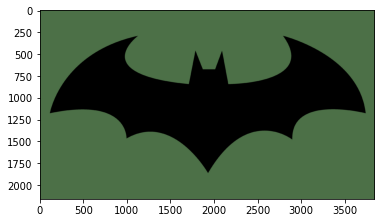

In [3]:
img = cv2.imread("images/batman.png")
plt.imshow(img)

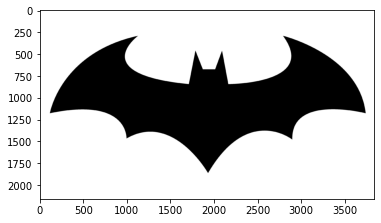

In [5]:
def convert_to_bw(img: np.ndarray) -> np.ndarray:
    """
    Converts an image to black and white. Will only select pixels above some threshold (the second parameter in cv2.threshold(), which needs to be tinkered with
    """
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, threshold = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY)
    return threshold


threshold = convert_to_bw(img)
plt.imshow(cv2.cvtColor(threshold, cv2.COLOR_BGR2RGB))

## Get Contours
Next, we will extract the contours of the image and put them into $x$ and $y$ arrays. This is where many problems occur. For more complicated images (and sometimes even simple ones), there will be a big mess since all the contours are being connected. I haven't found a way to avoid this so far... I tried

- Traveling salesman using hill climbing (*which as one might imagine, was super slow and rarely improved anything*)
- Determine points with the largest distance between them and simply removing them from the coordinates, but that actually exacerbated the problem since it was just creating other, longer links between points and making more of a mess
- Using a greedy algorithm that would load the coordinate data for the first contour, then the next contour in the list in a separate array, then add the point with the minimum distance from the final point in the first array and all the remaining points in the second (if that makes sense). This had very minor improvements, but the waiting time was not worth it.

This means that it's pretty much limited to drawing simple things like outlines until I can find a better method.

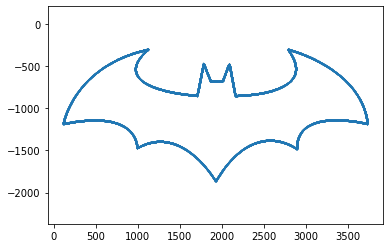

In [6]:
def read_contours(img: np.ndarray, threshold: np.ndarray) -> (np.ndarray, np.ndarray):
    contours, hierarchy = cv2.findContours(image=threshold, mode=cv2.RETR_TREE, method=cv2.CHAIN_APPROX_NONE)
    xs = []
    ys = []
    
    # Also requires a bit of tinkering
    for contour in contours[1:]:
        xs.extend(contour[:, :, 0].reshape(-1,))
        ys.extend(contour[:, :, 1].reshape(-1,))

    xs = np.array(xs, dtype='int64')
    ys =- np.array(ys, dtype='int64') # otherwise we will get a cursed, upside down photo
    
    return xs, ys, contours

xs, ys, contours = read_contours(img, threshold)
plt.axis('equal')
plt.plot(xs, ys, 'o', markersize=0.5)

## Center points around origin
Next we will center our data around the origin so we have a clear starting point for the animation (since my attempts at trying to find the center from points just ended up with the animation *being in a completely different place*.

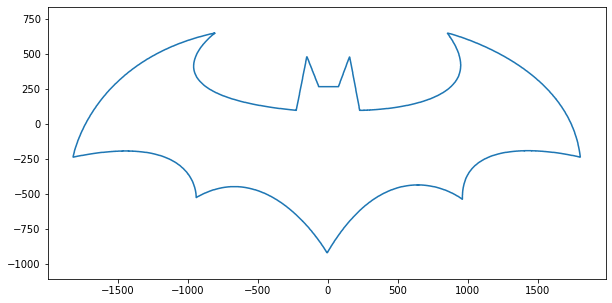

In [7]:
def center_around_origin(xs: np.ndarray, ys: np.ndarray):
    return xs - xs.mean(), ys - ys.mean()

xsc, ysc = center_around_origin(np.array(xs)[::], np.array(ys)[::])
        
fig = matplotlib.pyplot.gcf()
fig.set_size_inches(10, 5)
plt.axis('equal')
plt.plot(xsc, ysc, markersize=0.5)

# We'll save this for later when we animate
xlim_data = plt.xlim() 
ylim_data = plt.ylim()

## Determine coefficients
From here, we will use our image data/coordinates to generate the coefficients of type $x+iy$ for each vector. Some interpolation will be required. I was originally going to use Lagrange Interpolation but it was super slow and seemed to have some issues input data as well, so just used NumPy's interpolation method.

In [8]:
def trapz(f: Callable[[float], float], l: float, r: float, n: int) -> float:
    """
    Numerical integration method from class
    """
    dx: float = (r - l) / n
    midsum: float = 2 * sum([f(l + i * dx) for i in range(1, n)])
    return 0.5 * dx * (f(l) + midsum + f(r))

def generate_coefficients(n: int, lg: Callable[[float], float]) -> List[float]:
    """
    Generates a list of coefficients for vectors
    """
    cs: List[float] = []
    for i in range(-n, n+1):
        g: Callable[[float], float] = lambda t : lg(t) * np.exp(-i * t * 1j)
        
        c_n: float = 1/(2*np.pi) * trapz(g, 0, 2*np.pi, 2000)
        cs.append(c_n)
    return cs

def sort_cs(cs: List[float], n: int) -> List[float]:
    sortedcs = [cs[n]]
    [sortedcs.extend([cs[n+i], cs[n-i]]) for i in range(1, n+1)]
        
    return np.array(sortedcs)

In [9]:
time_arr = np.linspace(0, 2 * np.pi, len(xsc))
lg = lambda t : np.interp(t, time_arr, xsc + 1j*ysc)
n = 100

coefficients = generate_coefficients(n, lg)

## Animate
The final step is to animate. 

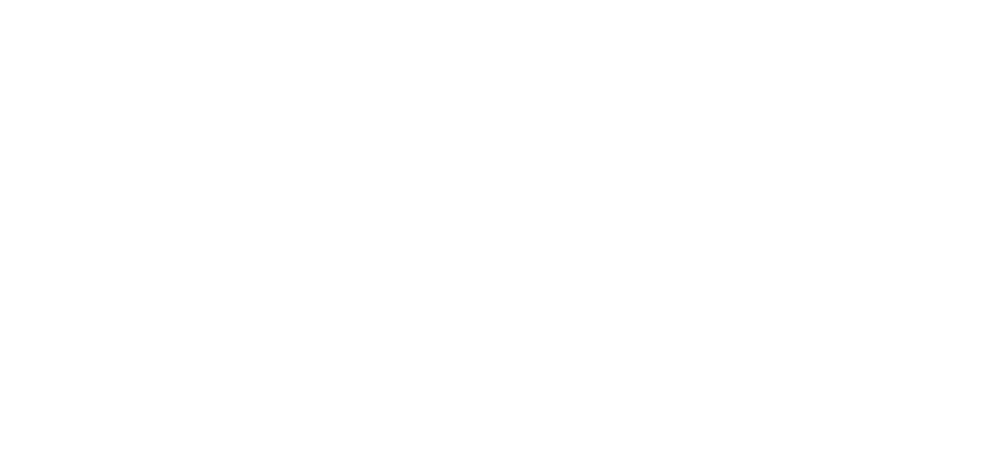

In [10]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), dpi=200);

# Make sure we can see entire drawing and remove axis / make aspect ratio less thicc
ax1.set_xlim(xlim_data[0]-50, xlim_data[1]+50)
ax1.set_ylim(ylim_data[0]-50, ylim_data[1]+50)
ax1.set_axis_off();
ax1.set_aspect('equal');

ax2.set_axis_off();
ax2.set_aspect('equal');

frames = 100

# Create circles
circles = [ax1.plot([], [], 'g-', linewidth=0.3)[0] for i in range(-n, n+1)]
circles2 = [ax2.plot([], [], 'g-', linewidth=0.3)[0] for i in range(-n, n+1)]

# Create vectors that are not arrows because matplotlib's arrow is v e r y  s l o w
lines = [ax1.plot([], [], 'y-', linewidth=0.3)[0] for i in range(-n, n+1)]
lines2 = [ax2.plot([], [], 'y-', linewidth=0.3)[0] for i in range(-n, n+1)]

# Drawings for both axes
drawing, = ax1.plot([], [], 'k-', linewidth=0.5)
drawing2, = ax2.plot([], [], 'k-', linewidth=0.5)
draw_x, draw_y = [], []

def draw_circle(k, c_real, c_imag, center_x, center_y):
    """
    Draws a circle with radius equal to length of vector and center at starting point of vector
    """
    r = np.linalg.norm([c_real, c_imag])
    theta = np.linspace(0, 2*np.pi, 50)
    
    x, y = center_x + r * np.cos(theta), center_y + r * np.sin(theta)
    
    circles[k].set_data(x, y)
    circles2[k].set_data(x, y)
    
def draw_line(k, c_real, c_imag, center_x, center_y):
    """
    Draws a rotating vector in the current frame
    """
    x, y = [center_x, center_x + c_real], [center_y, center_y + c_imag]
    
    lines[k].set_data(x, y)
    lines2[k].set_data(x, y)

def animiter(i, time_arr, cs):
    """
    Animates individual frames
    """
    
    # Multiplying 'rotates' the vectors
    cs = sort_cs(cs * np.array([np.exp(j*time_arr[i]*1j) for j in range(-n, n+1)]), n)
    
    # Gets the vector coordinates
    cs_real = cs.real
    cs_imag = cs.imag
    
    # We shall begin at origin
    center_x, center_y = 0, 0
    
    # Draw vectors/circles based on coefficients * the exponential part at this point in the time array
    for k, (c_real, c_imag) in enumerate(zip(cs_real, cs_imag)):
        draw_circle(k, c_real, c_imag, center_x, center_y)
        draw_line(k, c_real, c_imag, center_x, center_y)
        
        # Update so next vector starts on the tip of the previous
        center_x, center_y = center_x + c_real, center_y + c_imag
        
    draw_x.extend([center_x])
    draw_y.extend([center_y])
    
    # Z o o m
    ax2.set_xlim(center_x-100, center_x+100)
    ax2.set_ylim(center_y-100, center_y+100)
    
    drawing.set_data(draw_x, draw_y)
    drawing2.set_data(draw_x, draw_y)

In [11]:
matplotlib.rcParams['animation.embed_limit'] = 52_428_800.

# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=30, metadata=dict(artist='Me'), bitrate=1000)

frames=300
time_arr = np.linspace(0, 2*np.pi, num=frames)
anim = animation.FuncAnimation(fig, animiter, frames=frames, fargs=(time_arr, coefficients), interval=30)
#anim.save('lines.mp4', writer=writer)
HTML(anim.to_html5_video())

In [ ]:
anim.save('animation.mp4', writer=writer)